# Visualization of 3D Marchenko data in time and frequency

### Author: M.Ravasi

This notebook is used to display the 3D Synthetic dataset for the Marchenko redatuming problem, both in time and frequency domain

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import shutil
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
from scipy.io import loadmat

In [4]:
filepath = '/home/ravasim/Documents/Data/Marchenko3D/'
#filepath = '/project/k1524/users/ravasim/EAGE_MDCHPC_2020/'

## Acquisition geometry

First of all, let's look at the acquisition geometry and subsurface model we used to create the seismic data. 

In this synthetic example, we use a staggered-grid vector-acoustic FD modelling code to create data from dipole sources to pressure receivers (as required by the theory of Marchenko redatuming).

In real life, the data will be generally acquired in the field using airguns or vibroseises as sources and geophones or hydrophones as receivers.

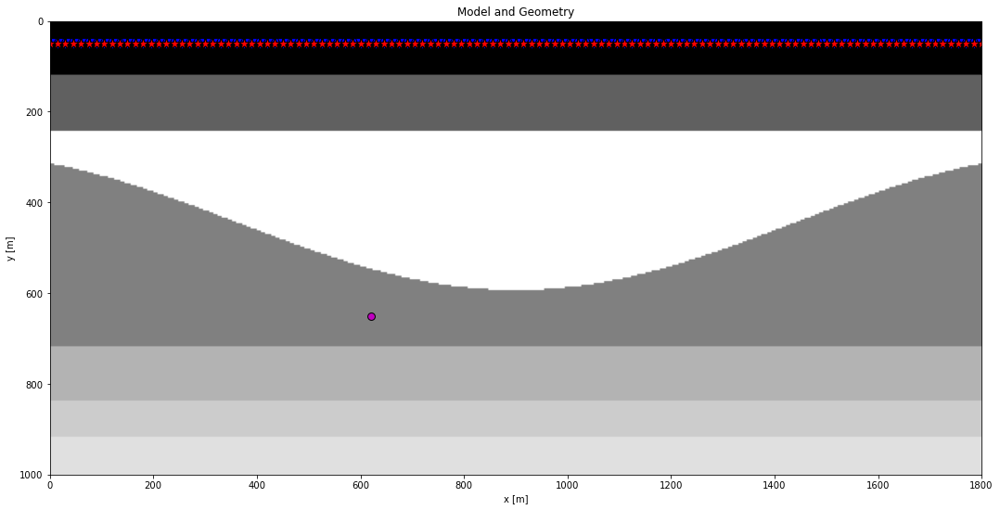

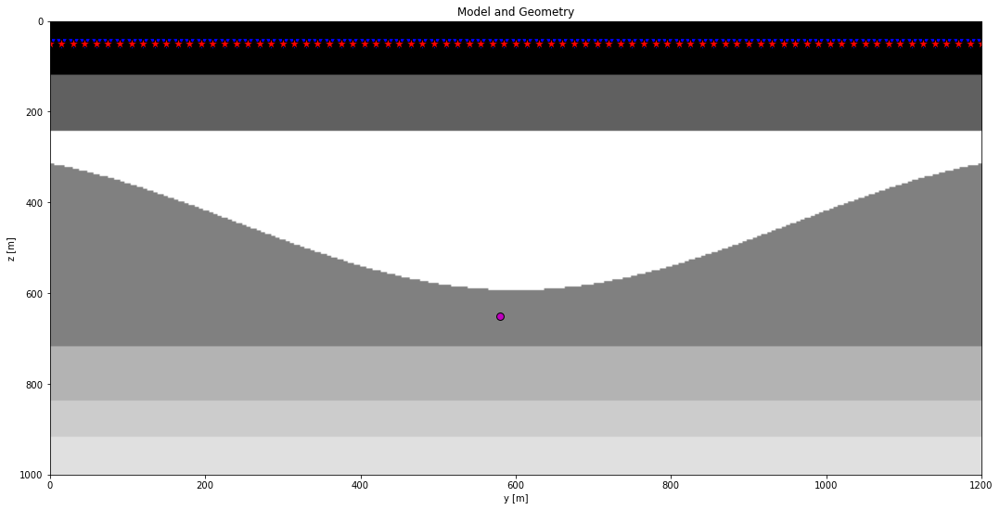

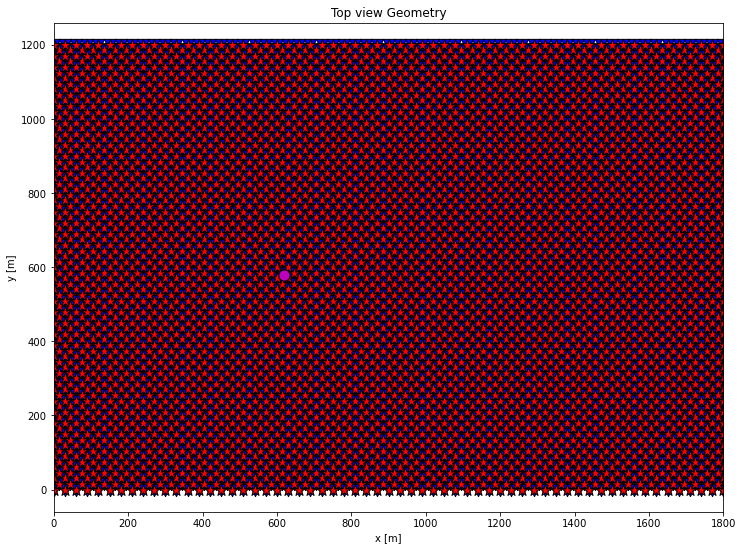

In [5]:
inputfile_aux = os.path.join(filepath, '3DMarchenko_auxiliary_2.npz' )
inputdata_aux = np.load(inputfile_aux)

# Receivers
r = inputdata_aux['recs'].T
nr = r.shape[1]
dr = r[0,1]-r[0,0]

# Sources
s = inputdata_aux['srcs'].T
ns = s.shape[1]
ds = s[0,1]-s[0,0]

# Virtual points
vs = inputdata_aux['vs']

# Time axis
ot, dt, nt = 0, 2.5e-3, 601
t = np.arange(nt)*dt

# Density model
rho = inputdata_aux['rho']
z, x, y = inputdata_aux['z'], inputdata_aux['x'], inputdata_aux['y']

plt.figure(figsize=(18,9))
plt.imshow(rho[np.argmin(np.abs(x-vs[1]))].T, cmap='gray', extent = (x[0], x[-1], z[-1], z[0]))
plt.scatter(r[0, ::10],  r[2, ::10], marker='v', s=150, c='b', edgecolors='k')
plt.scatter(s[0, 5::10], s[2, 5::10], marker='*', s=150, c='r', edgecolors='k')
plt.scatter(vs[0], vs[2], marker='.', s=250, c='m', edgecolors='k')
plt.axis('tight')
plt.xlabel('x [m]'),plt.ylabel('y [m]'),plt.title('Model and Geometry')
plt.xlim(x[0], x[-1]);

plt.figure(figsize=(18,9))
plt.imshow(rho[np.argmin(np.abs(y-vs[0]))].T, cmap='gray', extent = (y[0], y[-1], z[-1], z[0]))
plt.scatter(r[1, ::10],  r[2, ::10], marker='v', s=150, c='b', edgecolors='k')
plt.scatter(s[1, 5::10], s[2, 5::10], marker='*', s=150, c='r', edgecolors='k')
plt.scatter(vs[1], vs[2], marker='.', s=250, c='m', edgecolors='k')
plt.axis('tight')
plt.xlabel('y [m]'),plt.ylabel('z [m]'),plt.title('Model and Geometry')
plt.xlim(y[0], y[-1]);

plt.figure(figsize=(12,9))
plt.scatter(r[0, ::2],  r[1, ::2], marker='v', s=150, c='b', edgecolors='k')
plt.scatter(s[0, ::2], s[1, ::2], marker='*', s=150, c='r', edgecolors='k')
plt.scatter(vs[0], vs[1], marker='.', s=500, c='m', edgecolors='k')
plt.axis('equal')
plt.xlabel('x [m]'),plt.ylabel('y [m]'),plt.title('Top view Geometry')
plt.xlim(x[0], x[-1]);

Now we plot the sources x and y location. As we can see from the right plot we have 121 sources/receivers per line for a total of 81 parallel lines.

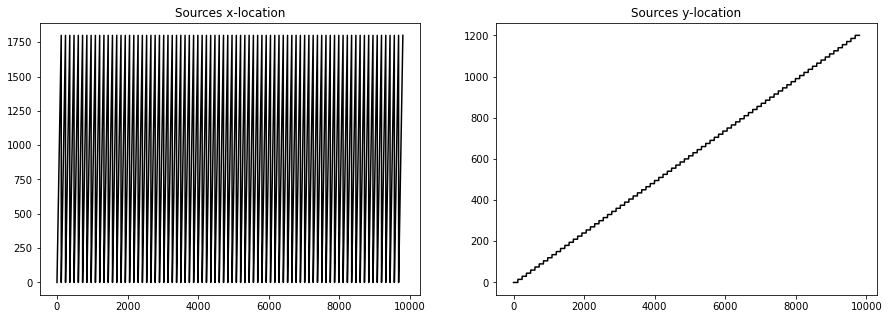

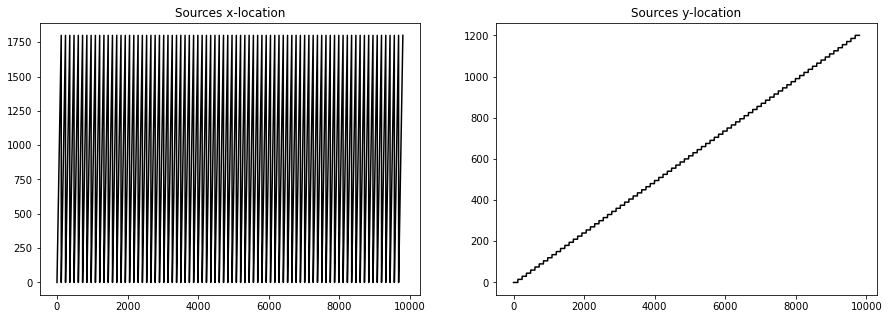

In [6]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].plot(s[0], 'k')
axs[0].set_title('Sources x-location')
axs[1].plot(s[1], 'k')
axs[1].set_title('Sources y-location');

fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].plot(s[0], 'k')
axs[0].set_title('Sources x-location')
axs[1].plot(s[1], 'k')
axs[1].set_title('Sources y-location');

## Time domain data

Let's now look at the data in time domain.

To mimic what we would generally obtain in real life, the data is divided into multiple binary files containing a group of sources and the entire receiver and time dimensions.

First 2450 sources, all receivers, all time

In [77]:
R = np.load(os.path.join(filepath, '3DMarchenko_data_batch0_2449.npy'), mmap_mode='r')
print(f'ns={R.shape[0]}, nr={R.shape[1]}, nt={R.shape[2]}')

ns=2450, nr=9801, nt=601


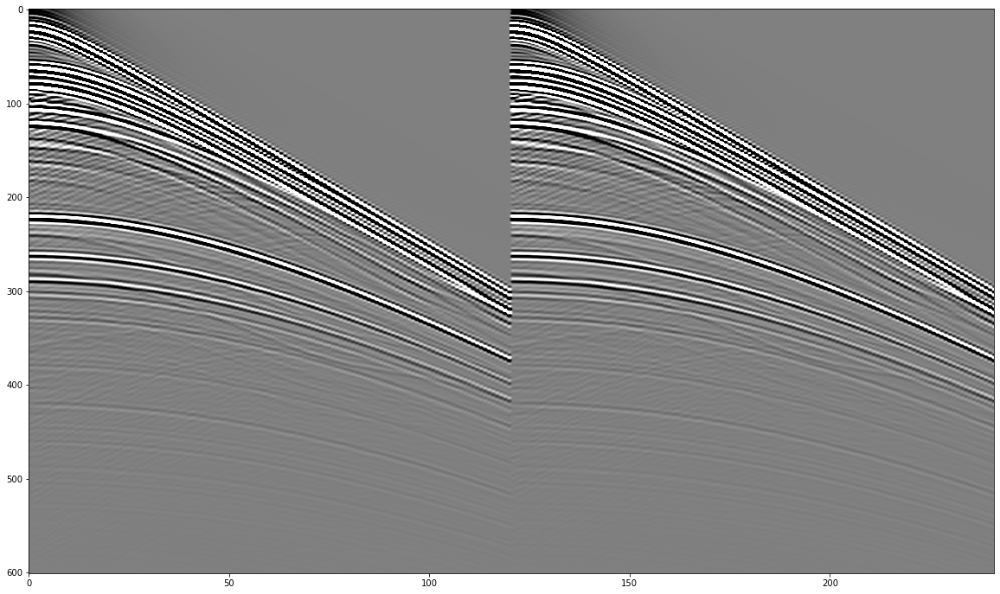

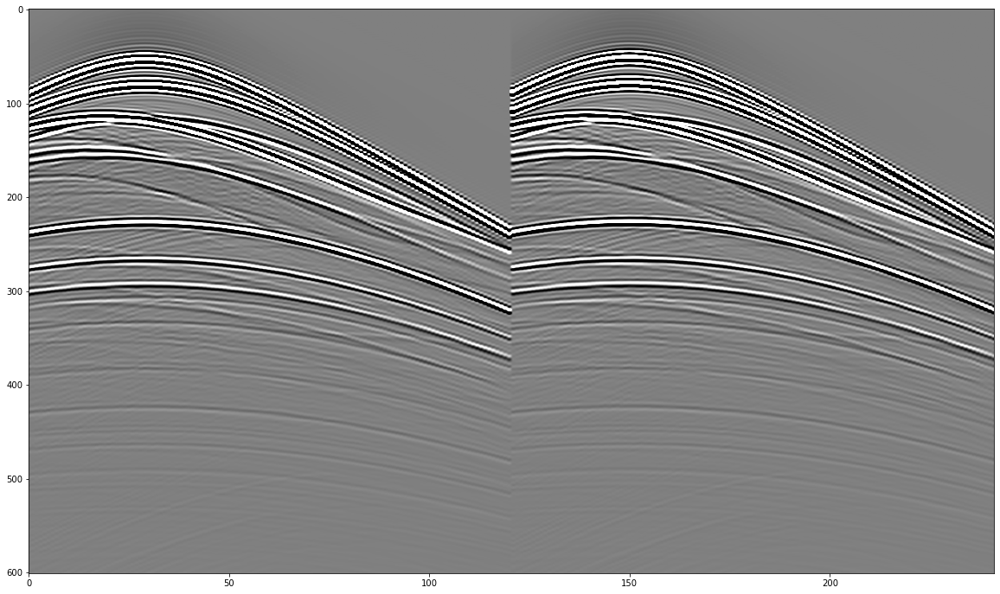

In [97]:
plt.figure(figsize=(20, 12))
plt.imshow(R[0].T, vmin=-1e-5, vmax=1e-5, cmap='gray');
plt.axis('tight');
plt.xlim(0, 241) # uncomment to see just two receiver lines

plt.figure(figsize=(20, 12))
plt.imshow(R[2449].T, vmin=-1e-5, vmax=1e-5, cmap='gray');
plt.axis('tight')
plt.xlim(0, 241); # uncomment to see just two receiver lines

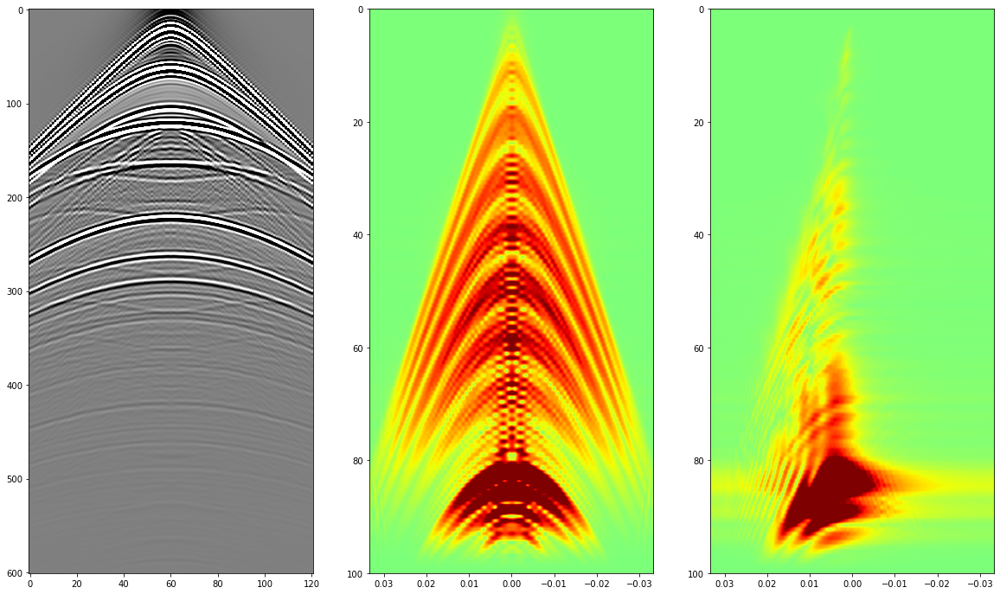

In [110]:
# extract one shot and show fk spectrum
Rsingleshot = R[60].reshape(81, 121, nt)

nfft = 2 ** 9
faxis = np.fft.fftfreq(nfft, dt)
kaxis = np.fft.fftfreq(nfft, dr)
Rfreq = np.fft.fftn(Rsingleshot, (nfft, nfft, nfft))

fig, axs = plt.subplots(1, 3, figsize=(20, 12))
axs[0].imshow(Rsingleshot[0].T, vmin=-1e-5, vmax=1e-5, cmap='gray')
axs[0].axis('tight')
axs[1].imshow(np.fft.fftshift(np.abs(Rfreq[nfft//2]), axes=0)[:, :nfft//2].T, vmin=-5e-2, vmax=5e-2, cmap='jet',
              extent=(-kaxis[nfft//2], kaxis[nfft//2], faxis[nfft//2-1], faxis[0]));
axs[1].axis('tight')
axs[1].set_ylim(100, 0)
axs[2].imshow(np.fft.fftshift(np.abs(Rfreq[:, nfft//2]), axes=0)[:, :nfft//2].T, vmin=-5e-2, vmax=5e-2, cmap='jet',
              extent=(-kaxis[nfft//2], kaxis[nfft//2], faxis[nfft//2-1], faxis[0]));
axs[2].axis('tight')
axs[2].set_ylim(100, 0);

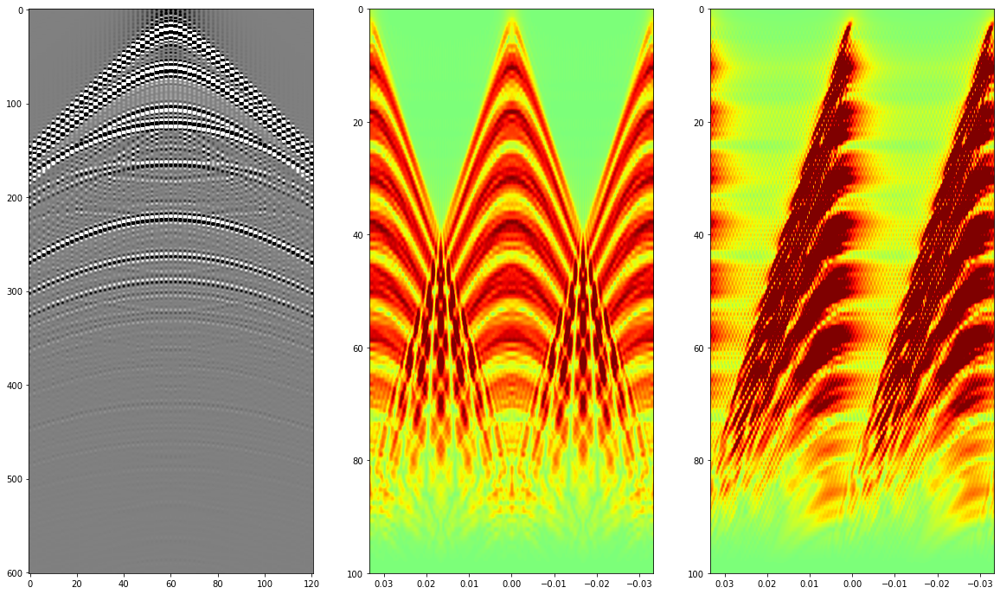

In [114]:
# extract one shot and show fk spectrum with sub2
Rsingleshotall = R[60].reshape(81, 121, nt)
Rsingleshot = np.zeros_like(Rsingleshotall)
Rsingleshot[::2, ::2, :] = Rsingleshotall[::2, ::2, :]

nfft = 2 ** 9
faxis = np.fft.fftfreq(nfft, dt)
kaxis = np.fft.fftfreq(nfft, dr)
Rfreq = np.fft.fftn(Rsingleshot, (nfft, nfft, nfft))

fig, axs = plt.subplots(1, 3, figsize=(20, 12))
axs[0].imshow(Rsingleshot[0].T, vmin=-1e-5, vmax=1e-5, cmap='gray')
axs[0].axis('tight')
axs[1].imshow(np.fft.fftshift(np.abs(Rfreq[nfft//2]), axes=0)[:, :nfft//2].T, vmin=-1e-1, vmax=1e-1, cmap='jet',
              extent=(-kaxis[nfft//2], kaxis[nfft//2], faxis[nfft//2-1], faxis[0]));
axs[1].axis('tight')
axs[1].set_ylim(100, 0)
axs[2].imshow(np.fft.fftshift(np.abs(Rfreq[:, nfft//2]), axes=0)[:, :nfft//2].T, vmin=-1e-1, vmax=1e-1, cmap='jet',
              extent=(-kaxis[nfft//2], kaxis[nfft//2], faxis[nfft//2-1], faxis[0]));
axs[2].axis('tight')
axs[2].set_ylim(100, 0);

From 2450 to 4900

In [7]:
R = np.load(os.path.join(filepath, '3DMarchenko_data_batch2450_4899.npy'), mmap_mode='r')
print(f'ns={R.shape[0]}, nr={R.shape[1]}, nt={R.shape[2]}')

ns=2450, nr=9801, nt=601


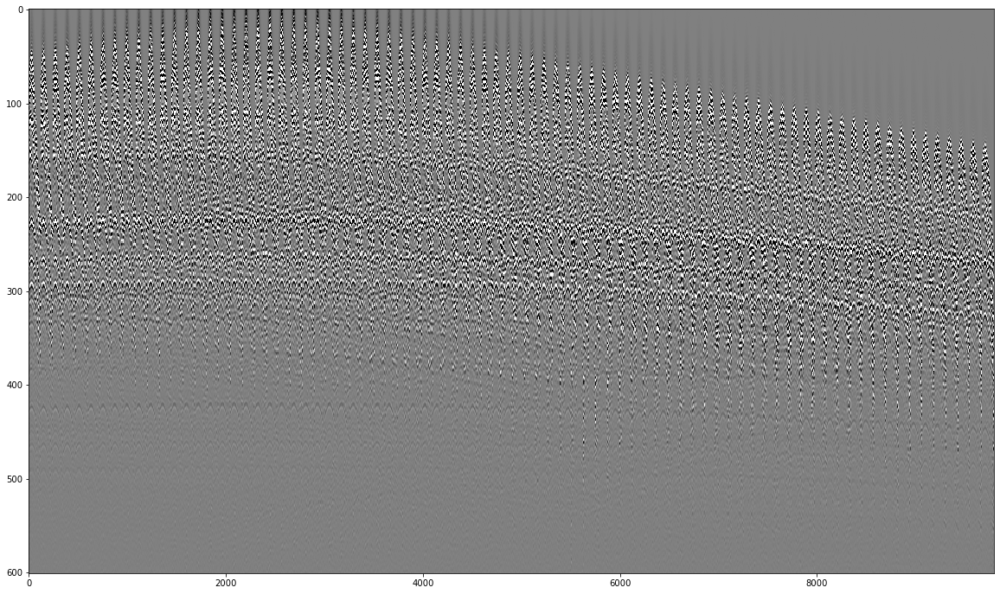

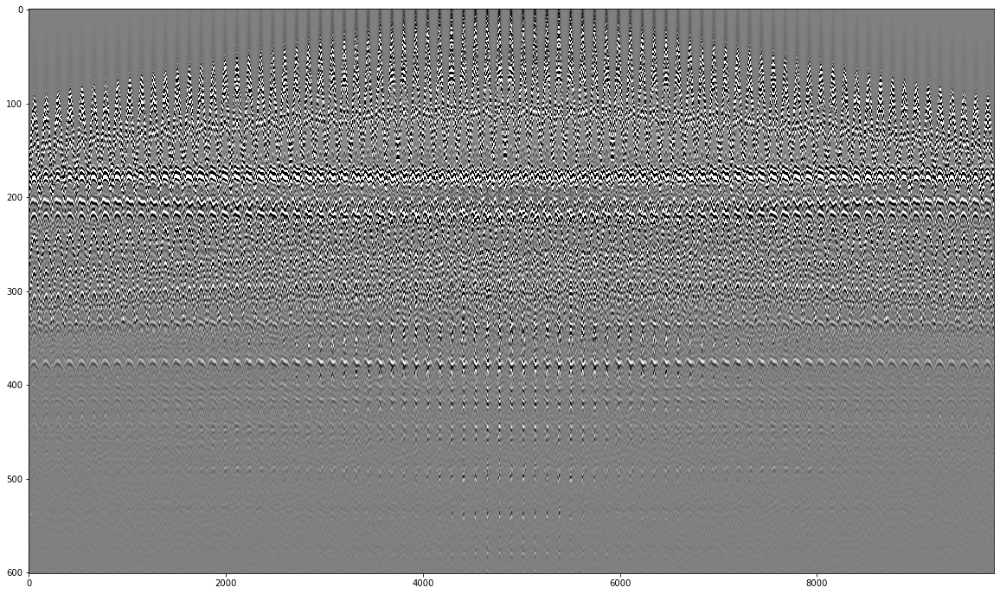

In [8]:
plt.figure(figsize=(20, 12))
plt.imshow(R[0].T, vmin=-1e-5, vmax=1e-5, cmap='gray');
plt.axis('tight');
#plt.xlim(0, 241) # uncomment to see just two receiver lines

plt.figure(figsize=(20, 12))
plt.imshow(R[2449].T, vmin=-1e-5, vmax=1e-5, cmap='gray');
plt.axis('tight');
#plt.xlim(0, 241); # uncomment to see just two receiver lines

From 4900 to 7350

In [55]:
R = np.load(os.path.join(filepath, '3DMarchenko_data_batch4900_7349.npy'), mmap_mode='r')
print(f'ns={R.shape[0]}, nr={R.shape[1]}, nt={R.shape[2]}')

ns=2450, nr=9801, nt=601


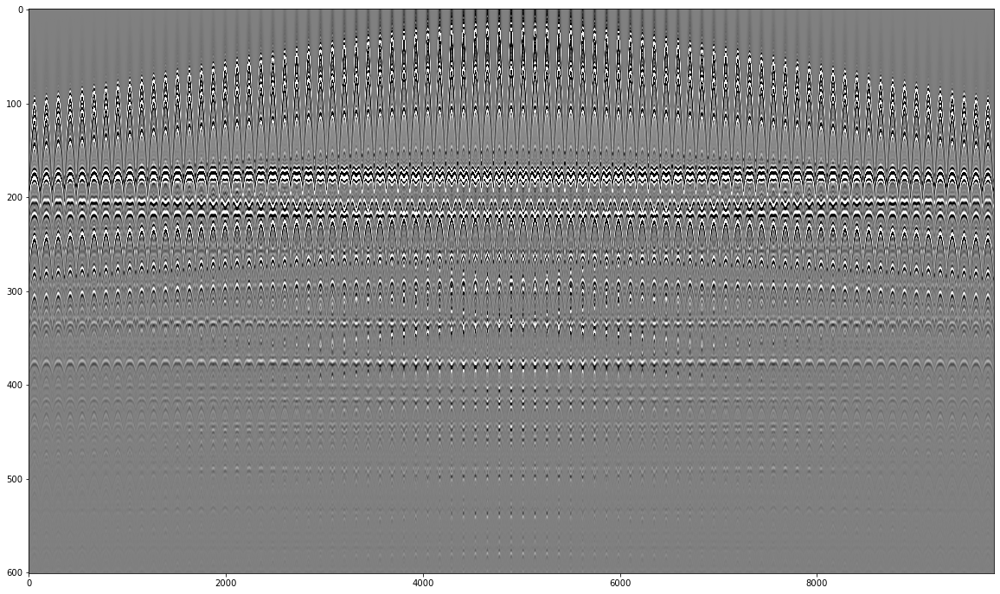

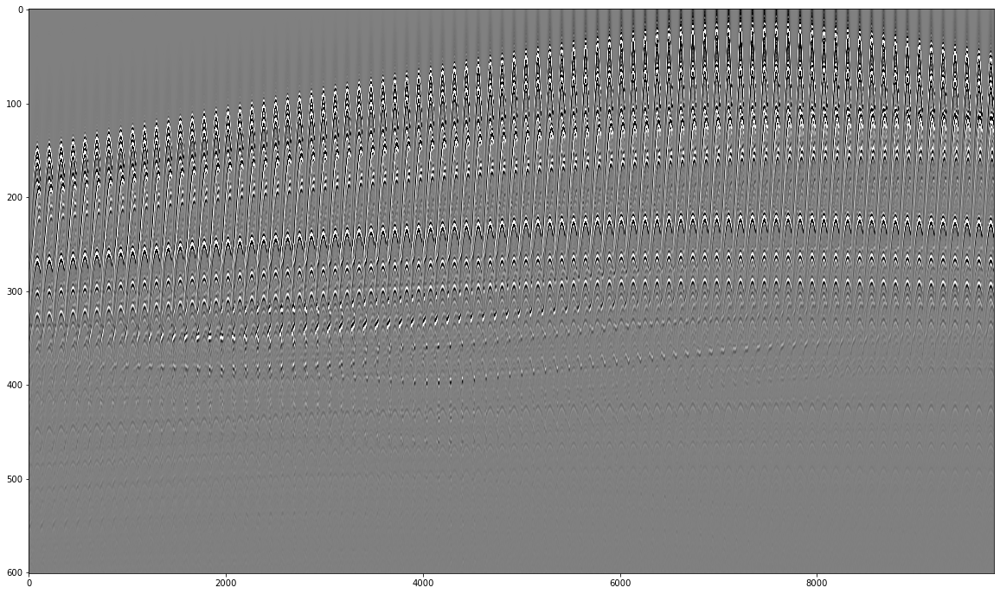

In [56]:
plt.figure(figsize=(20, 12))
plt.imshow(R[0].T, vmin=-1e-5, vmax=1e-5, cmap='gray');
plt.axis('tight');
#plt.xlim(0, 241); # uncomment to see just two receiver lines

plt.figure(figsize=(20, 12))
plt.imshow(R[2449].T, vmin=-1e-5, vmax=1e-5, cmap='gray');
plt.axis('tight');
#plt.xlim(0, 241); # uncomment to see just two receiver lines

From 7350 to 9800

In [10]:
R = np.load(os.path.join(filepath, '3DMarchenko_data_batch7350_9800.npy'), mmap_mode='r')
print(f'ns={R.shape[0]}, nr={R.shape[1]}, nt={R.shape[2]}')

ns=2451, nr=9801, nt=601


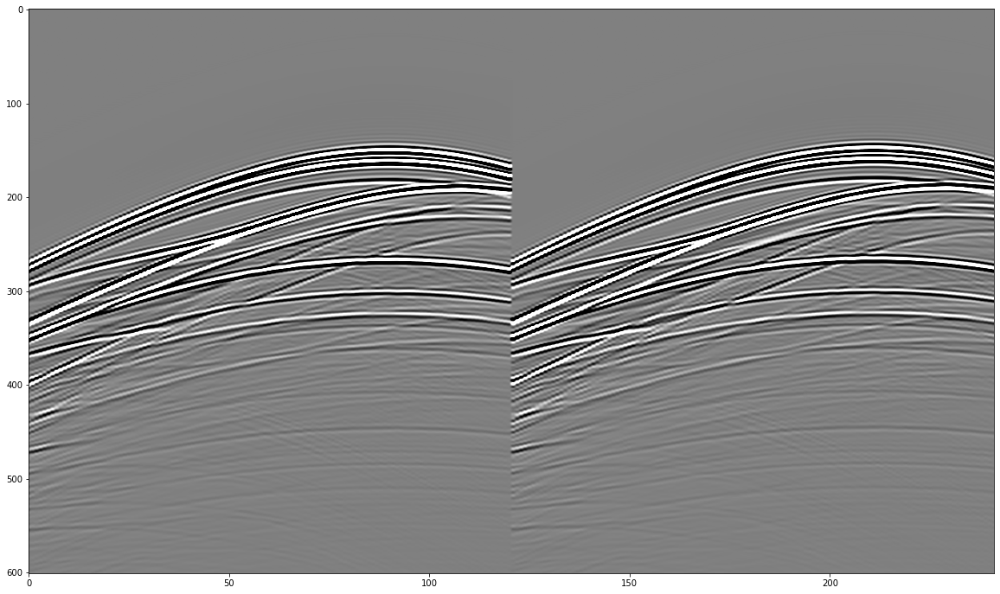

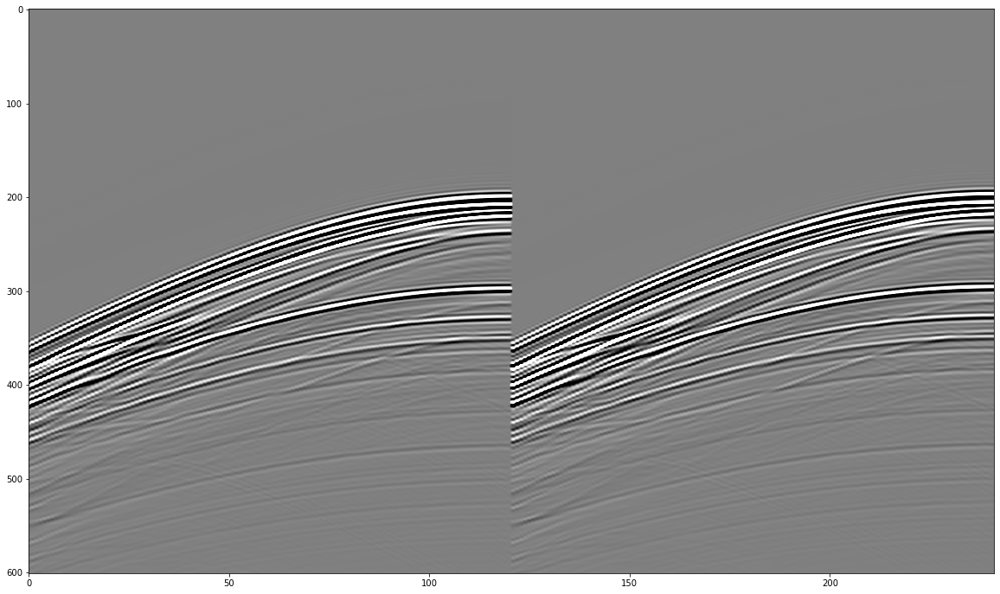

In [11]:
plt.figure(figsize=(20, 12))
plt.imshow(R[0].T, vmin=-1e-5, vmax=1e-5, cmap='gray');
plt.axis('tight');
plt.xlim(0, 241); # uncomment to see just two receiver lines

plt.figure(figsize=(20, 12))
plt.imshow(R[2449].T, vmin=-1e-5, vmax=1e-5, cmap='gray');
plt.axis('tight');
plt.xlim(0, 241); # uncomment to see just two receiver lines

## Frequency domain data

In order to be able to solve the redatuming problems we are interested in, the recorded seismic data must be first converted to the frequency domain. 

We currently do this using the following script https://github.com/mrava87/EAGE_MDCHPC_2020/blob/master/Marchenko3D_datacreation.ipynb and we save the dense frequency-source-receiver representation of the data in the [ZARR](https://zarr.readthedocs.io/en/stable/) format. This represents the **kernel** of our multi-dimensional convolution (MDC) modelling operator. We use Zarr as we can easily combine it with [DASK](https://dask.org/) to parallelize our computations over groups of frequencies. This is not a hard requirement, it is so far our implementation strategy but anything else (likely more efficient) is welcome! 

At this point you can either load the entire dataset from the Zarr format using the following code or load directly 3 frequencies slides I have saved into .mat files.

In [13]:
"""
Rda = zarr.open(os.path.join(filepath, 'input3D_sub1_ffirst.zarr'), mode='r')

ifreqs = [30, 100, 200]

for ifreq in ifreqs:
    Rda_fslice = Rda[ifreq]

    plt.figure(figsize=(10, 10))
    plt.imshow(np.abs(Rda_fslice), vmin=0, vmax=1e-4)
    plt.axis('tight')
    
    plt.figure(figsize=(10, 10))
    plt.imshow(np.abs(Rda_fslice), vmin=0, vmax=1e-4)
    plt.axis('tight')
    plt.xlim(0, 400)
    plt.ylim(400, 0)
    
    savemat("Mck_freqslice%d.mat" % ifreq, {'Rfreq': Rda_fslice})
"""

'\nRda = zarr.open(os.path.join(filepath, \'input3D_sub1_ffirst.zarr\'), mode=\'r\')\n\nifreqs = [30, 100, 200]\n\nfor ifreq in ifreqs:\n    Rda_fslice = Rda[ifreq]\n\n    plt.figure(figsize=(10, 10))\n    plt.imshow(np.abs(Rda_fslice), vmin=0, vmax=1e-4)\n    plt.axis(\'tight\')\n    \n    plt.figure(figsize=(10, 10))\n    plt.imshow(np.abs(Rda_fslice), vmin=0, vmax=1e-4)\n    plt.axis(\'tight\')\n    plt.xlim(0, 400)\n    plt.ylim(400, 0)\n    \n    savemat("Mck_freqslice%d.mat" % ifreq, {\'Rfreq\': Rda_fslice})\n'

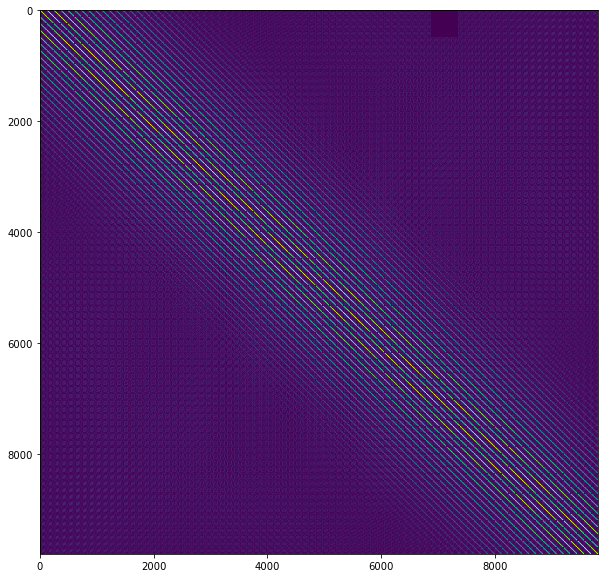

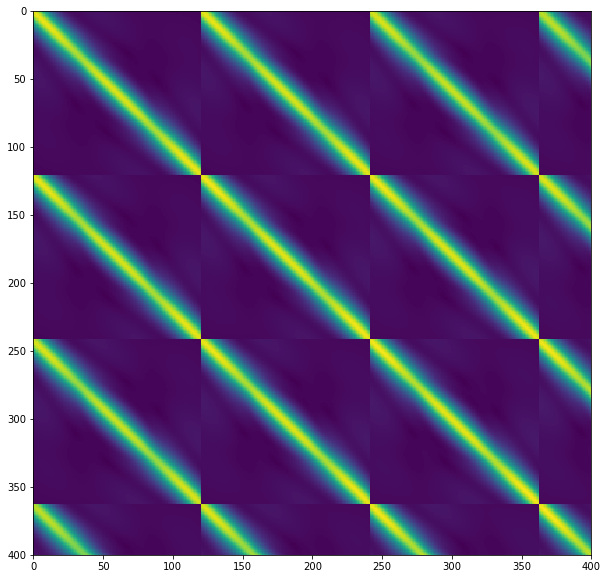

In [14]:
ifreq = 30
Mck_freqslice30 = loadmat(os.path.join(filepath, 'Mck_freqslice30.mat'))
Mck_freqslice30 = Mck_freqslice30['Rfreq']

plt.figure(figsize=(10, 10))
plt.imshow(np.abs(Mck_freqslice30), vmin=0, vmax=1e-4)
plt.axis('tight')
    
plt.figure(figsize=(10, 10))
plt.imshow(np.abs(Mck_freqslice30), vmin=0, vmax=1e-4)
plt.axis('tight')
plt.xlim(0, 400)
plt.ylim(400, 0);

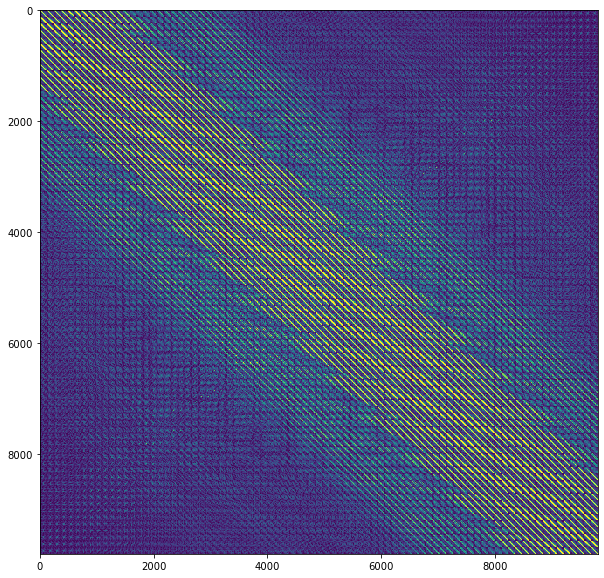

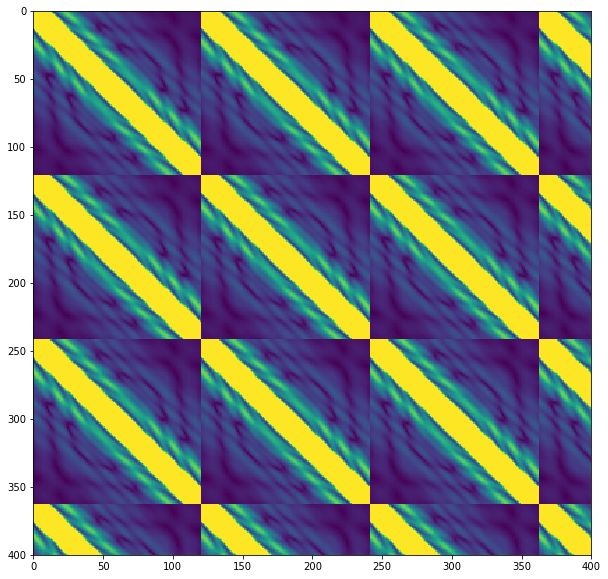

In [15]:
ifreq = 100
Mck_freqslice100 = loadmat(os.path.join(filepath, 'Mck_freqslice100.mat'))
Mck_freqslice100 = Mck_freqslice100['Rfreq']

plt.figure(figsize=(10, 10))
plt.imshow(np.abs(Mck_freqslice100), vmin=0, vmax=1e-4)
plt.axis('tight')

plt.figure(figsize=(10, 10))
plt.imshow(np.abs(Mck_freqslice100), vmin=0, vmax=1e-4)
plt.axis('tight')
plt.xlim(0, 400)
plt.ylim(400, 0);

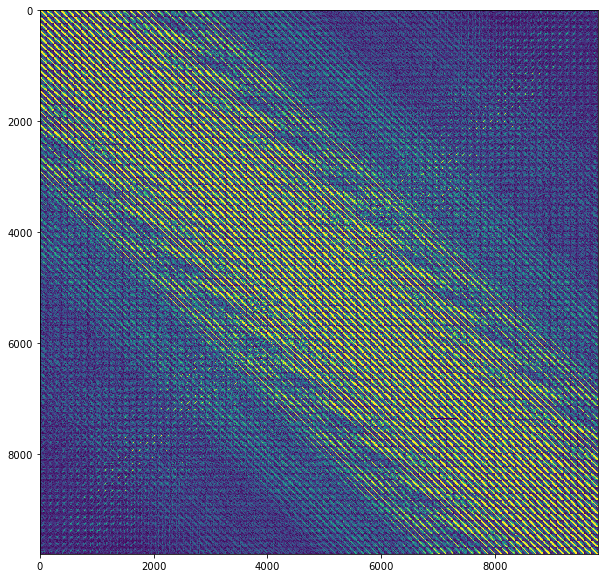

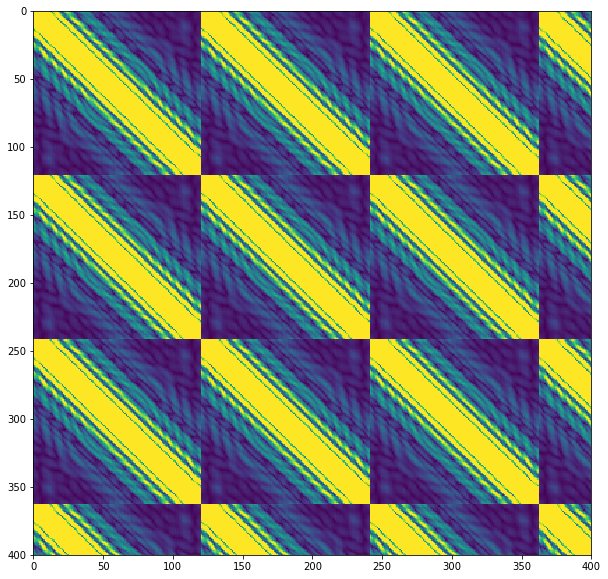

In [16]:
ifreq = 200
Mck_freqslice200 = loadmat(os.path.join(filepath, 'Mck_freqslice200.mat'))
Mck_freqslice200 = Mck_freqslice200['Rfreq']

plt.figure(figsize=(10, 10))
plt.imshow(np.abs(Mck_freqslice200), vmin=0, vmax=1e-4)
plt.axis('tight')

plt.figure(figsize=(10, 10))
plt.imshow(np.abs(Mck_freqslice200), vmin=0, vmax=1e-4)
plt.axis('tight')
plt.xlim(0, 400)
plt.ylim(400, 0);